In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Sequential # type: ignore
from tensorflow.keras.layers import Dense # type: ignore
from tensorflow.keras.activations import linear, relu, sigmoid # type: ignore

In [2]:
def rmse(y, yhat):
    n, m = y.shape
    diff = y - yhat
    err = np.sqrt(np.sum(diff**2, axis=1)) 
    return np.mean(err)

In [3]:
def filter_data(data):
    Ca_data = np.array(data.iloc[:, :300])
    index = []
    for i in range(len(Ca_data)):
        first_diff = np.diff(Ca_data[i], n=1)[200:]
        second_diff = np.diff(Ca_data[i], n=2)[200:]
        third_diff = np.diff(Ca_data[i], n=3)[200:]
        if np.mean(first_diff) < 1e-5:
            if np.mean(second_diff) < 1e-5:
                if np.mean(third_diff) < 1e-5:
                    index.append(i)
    index = np.array(index)
    filt_data = data.drop(index)
    return filt_data

In [4]:
data = pd.read_excel("simulated_data2.xlsx")
data.shape

(16807, 305)

In [5]:
filt_data = filter_data(data)
filt_data.shape

(10505, 305)

In [6]:
X = filt_data.iloc[:, :300]
y = filt_data.iloc[:, 300:]
print(X.shape)
print(y.shape)

(10505, 300)
(10505, 5)


In [7]:
X_train, X_, y_train, y_ = train_test_split(X, y, test_size=0.2, random_state=0)
X_cv, X_test, y_cv, y_test = train_test_split(X_, y_, test_size=0.5, random_state=1)
print(X_train.shape, X_cv.shape, X_test.shape)
print(y_train.shape, y_cv.shape, y_test.shape)

(8404, 300) (1050, 300) (1051, 300)
(8404, 5) (1050, 5) (1051, 5)


In [8]:
tf.random.set_seed(5)
model = Sequential(
    [
        tf.keras.layers.InputLayer((300,)),
        Dense(80, activation="relu", name="L1"),
        Dense(40, activation="relu", name="L2"),
        Dense(25, activation="relu", name="L3"),
        Dense(5, activation="linear", name="L4"),
    ]
)
model.compile(optimizer='adam', loss='mse') 

In [9]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 L1 (Dense)                  (None, 80)                24080     
                                                                 
 L2 (Dense)                  (None, 40)                3240      
                                                                 
 L3 (Dense)                  (None, 25)                1025      
                                                                 
 L4 (Dense)                  (None, 5)                 130       
                                                                 
Total params: 28475 (111.23 KB)
Trainable params: 28475 (111.23 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [10]:
history = model.fit(X_train, y_train, validation_data=(X_cv, y_cv), epochs=300)

Epoch 1/300

263/263 [==============================] - 3s 4ms/step - loss: 0.0065 - val_loss: 0.0014
Epoch 2/300
263/263 [==============================] - 1s 3ms/step - loss: 0.0012 - val_loss: 0.0010
Epoch 3/300
263/263 [==============================] - 1s 3ms/step - loss: 9.7077e-04 - val_loss: 9.4999e-04
Epoch 4/300
263/263 [==============================] - 1s 3ms/step - loss: 8.8590e-04 - val_loss: 8.5504e-04
Epoch 5/300
263/263 [==============================] - 1s 3ms/step - loss: 8.0158e-04 - val_loss: 8.3287e-04
Epoch 6/300
263/263 [==============================] - 1s 3ms/step - loss: 7.6572e-04 - val_loss: 8.0141e-04
Epoch 7/300
263/263 [==============================] - 1s 3ms/step - loss: 7.4312e-04 - val_loss: 8.2423e-04
Epoch 8/300
263/263 [==============================] - 1s 4ms/step - loss: 6.9050e-04 - val_loss: 7.2447e-04
Epoch 9/300
263/263 [==============================] - 1s 3ms/step - loss: 6.7262e-04 - val_loss: 7.3278e-04
Epoch 10/300
263/263 [============

In [11]:
model.evaluate(X_train, y_train)

263/263 [==============================] - 0s 1ms/step - loss: 1.0286e-04


0.00010285710595780984

In [12]:
test_loss = model.evaluate(X_test, y_test, verbose=0)
print("Test Loss:", test_loss)

Test Loss: 0.00022404688934329897


In [13]:
epochs = range(1, len(history.history['loss']) + 1)
test_losses = [test_loss] * len(epochs)
loss = history.history['loss']
val_loss = history.history['val_loss']

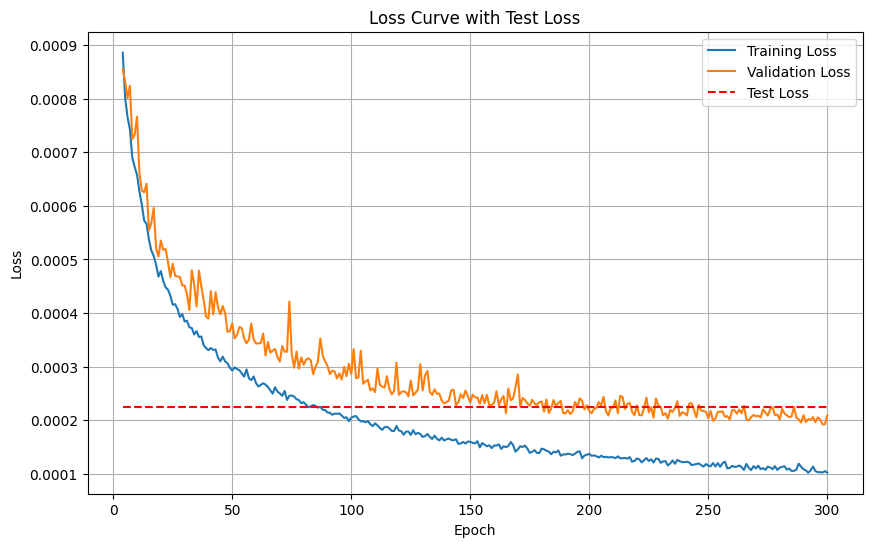

In [14]:
plt.figure(figsize=(10, 6))
plt.plot(epochs[3:], loss[3:], label='Training Loss')
plt.plot(epochs[3:], val_loss[3:], label='Validation Loss')
plt.plot(epochs[3:], test_losses[3:], 'r--', label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Curve with Test Loss')
plt.legend()
plt.grid(True)
plt.show()

In [15]:
def normalisation(k_Ca):
    min_Ca = np.min(k_Ca)
    max_Ca = np.max(k_Ca)
    return (k_Ca - min_Ca) / (max_Ca - min_Ca)

def lirinzel_ns(v2, a2, IP3, d5, k3):
    c0, c1 = 2, 0.185
    v1, v3 = 6, 0.9
    d1, d2, d3, Nd = 0.13, 1.049, 0.9434, 2
    time = np.arange(0, 300, 0.1)
    dt = 0.1
    Ca, h = [0.1], [0.1]  # Initialize lists

    # ODE solving
    for _ in range(1, len(time)):  # Start from index 1 to avoid index errors
        CaER = (c0 - Ca[-1]) / c1
        pinf = IP3 / (IP3 + d1)
        ninf = Ca[-1] / (Ca[-1] + d5)
        Q2 = d2 * (IP3 + d1) / (IP3 + d3)
        tauh = 1 / (a2 * (Q2 + Ca[-1]))
        hinf = Q2 / (Q2 + Ca[-1])
        alphah = hinf / tauh
        betah = (1 - hinf) / tauh
        dh = alphah * (1 - h[-1]) - betah * h[-1]
        dCa = (c1 * v1 * pinf**3 * ninf**3 * h[-1]**3 * (CaER - Ca[-1]) +
               c1 * v2 * (CaER - Ca[-1]) -
               v3 * Ca[-1]**2 / (Ca[-1]**2 + k3**2))
        
        # Append new values instead of assigning to an index
        Ca.append(Ca[-1] + dCa * dt)
        h.append(h[-1] + dh * dt)

    # Convert to NumPy array for interpolation
    Ca = np.array(Ca)
    Ca_norm = normalisation(Ca)

    return Ca_norm

In [16]:
def plot_graphs(n, x, y, yhat):
    t = np.arange(0, 300, 1)
    time = np.arange(0, 300, 0.1)
    p, q = x.shape
    for i in range(n):
        j = np.random.randint(0, p)
        plt.figure(figsize=(14, 4))

        plt.subplot(121)
        plt.scatter(y.iloc[j], yhat.iloc[j], c='blue')
        plt.plot([y.iloc[j].min(), y.iloc[j].max()],
                [y.iloc[j].min(), y.iloc[j].max()], 'r--')
        plt.title("Parameter Prediction")
        plt.xlabel('True')
        plt.ylabel('Predicted')
        plt.grid(True)

        plt.subplot(122)
        plt.plot(t, x.iloc[j], c='blue', label="Original", linewidth=2)
        plt.plot(time, lirinzel_ns(yhat.iloc[j, 0], yhat.iloc[j, 1], yhat.iloc[j, 2], yhat.iloc[j, 3], yhat.iloc[j, 4]), 
                 linewidth=2, c="red", label="Predicted")    
        plt.xlabel('Time')
        plt.ylabel('Value')
        plt.title("Time series prediction")
        plt.legend()
        plt.tight_layout()
        plt.show()

In [17]:
yhat = model.predict(X_train)
yhat = pd.DataFrame(yhat)
yhat

263/263 [==============================] - 0s 1ms/step


,0,1,2,3,4
0,0.126247,0.135783,0.447829,0.087426,0.079408
1,0.142596,0.130733,0.481740,0.087785,0.082579
2,0.124090,0.164160,0.418687,0.087390,0.085961
3,0.126778,0.131605,0.462170,0.086127,0.072136
4,0.049675,0.109235,0.643016,0.089488,0.090741
...,...,...,...,...,...
8399,0.077640,0.170261,0.415346,0.093239,0.101465
8400,0.140093,0.113621,0.476567,0.088999,0.084127
8401,0.131912,0.138435,0.482845,0.117959,0.099199
8402,0.082225,0.174362,0.412919,0.090630,0.103147


In [18]:
y_train

,v2,a2,IP3,d5,k3
14172,0.130296,0.136246,0.453347,0.083579,0.077682
6504,0.145631,0.133390,0.483842,0.087444,0.083062
2681,0.143235,0.171915,0.412450,0.087444,0.083610
4644,0.143235,0.136246,0.453419,0.087444,0.070881
1912,0.098440,0.118291,0.595215,0.094050,0.083062
...,...,...,...,...,...
14688,0.082118,0.171915,0.412450,0.087444,0.096156
6553,0.145631,0.118291,0.480371,0.087444,0.083062
4503,0.143235,0.136246,0.480371,0.119420,0.096156
15714,0.082118,0.166686,0.412450,0.080423,0.100028


In [19]:
rmse(np.array(y_train), np.array(yhat))

0.019547025457716458

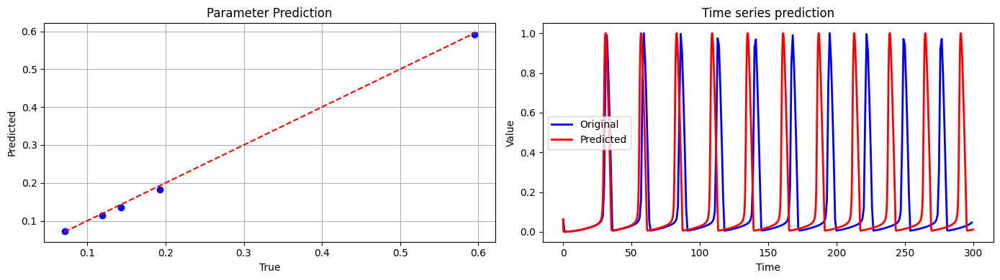

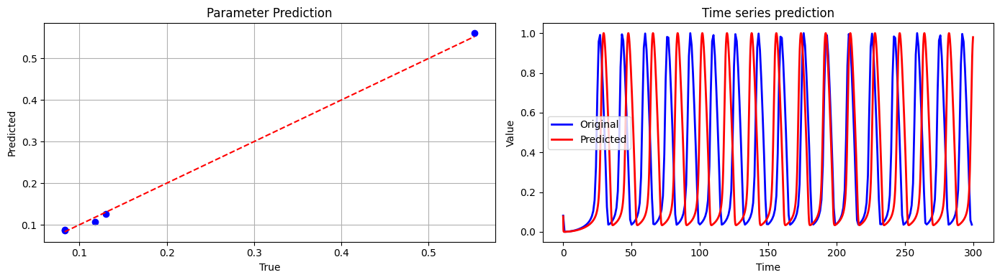

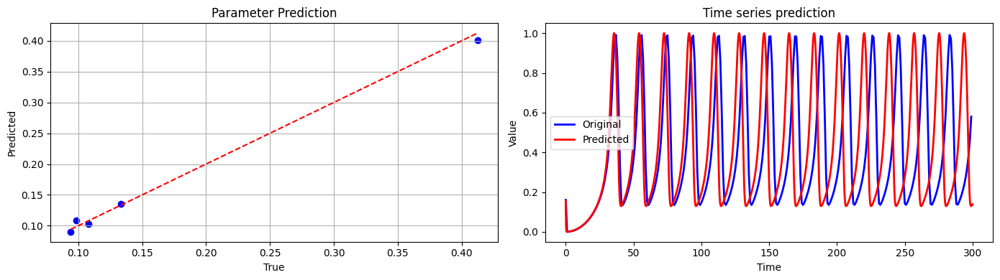

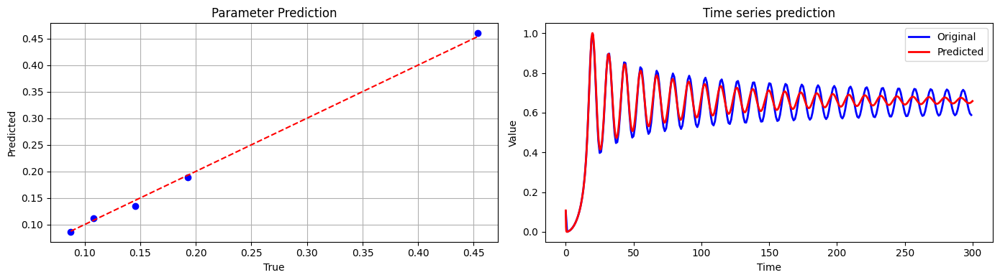

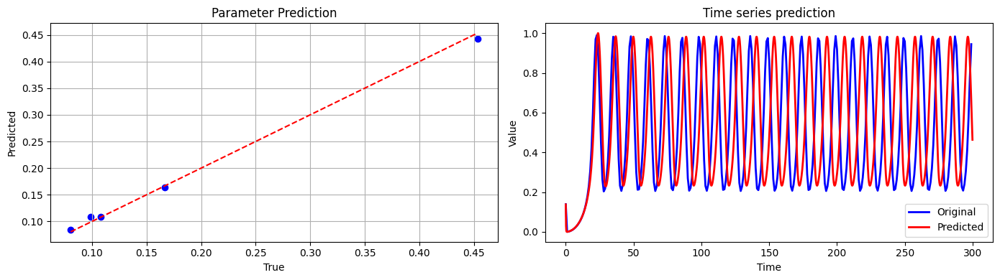

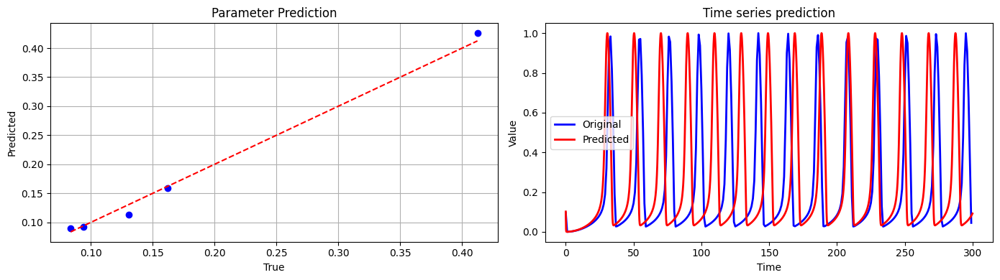

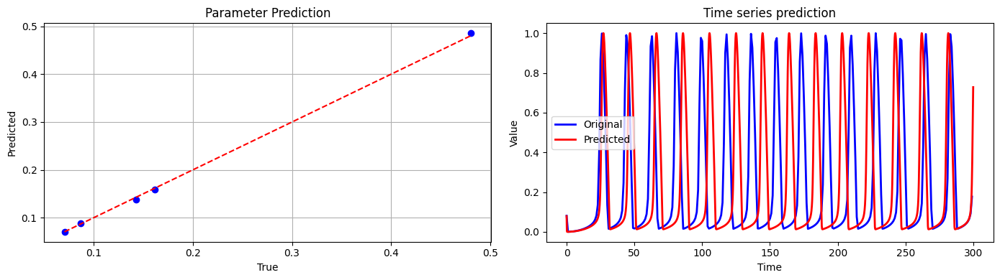

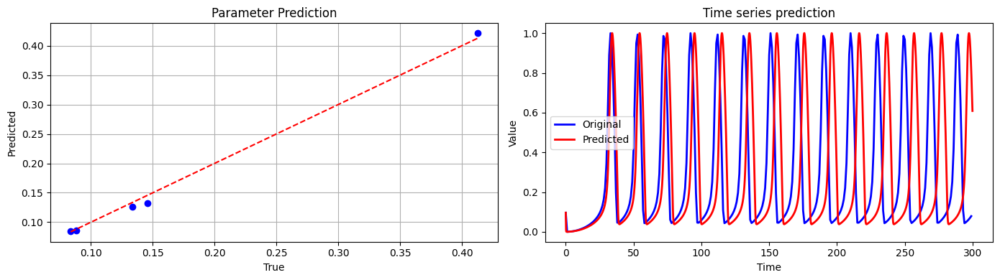

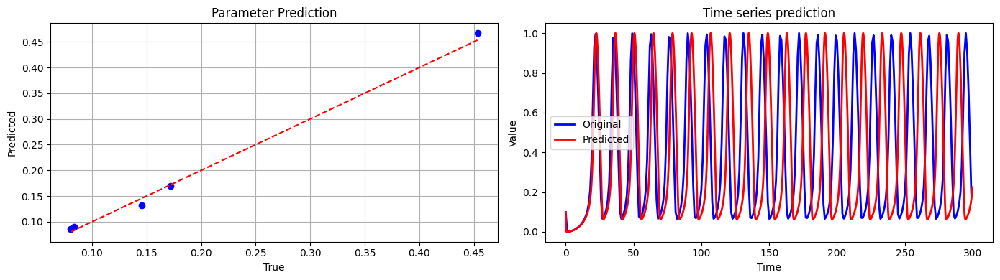

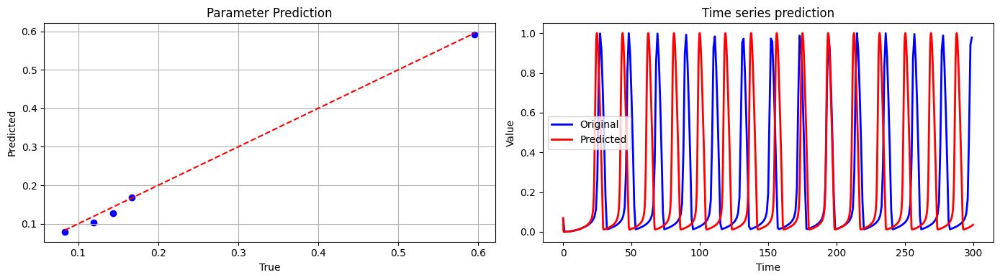

In [20]:
plot_graphs(10, X_train, y_train, yhat)

In [21]:
yhat_cv = model.predict(X_cv)
yhat_cv = pd.DataFrame(yhat_cv)
yhat_cv

33/33 [==============================] - 0s 1ms/step


,0,1,2,3,4
0,0.136324,0.126900,0.561260,0.086216,0.084561
1,0.031453,0.128666,0.484478,0.092237,0.092011
2,0.083383,0.112093,0.563575,0.086098,0.073989
3,0.112598,0.173986,0.536700,0.111349,0.091820
4,0.097244,0.130705,0.477082,0.085478,0.096137
...,...,...,...,...,...
1045,0.111791,0.161441,0.435803,0.084828,0.106957
1046,0.031971,0.137248,0.465084,0.095037,0.082296
1047,0.014305,0.158337,0.524478,0.086918,0.097913
1048,0.097594,0.113599,0.452973,0.083495,0.102710


In [22]:
y_cv

,v2,a2,IP3,d5,k3
3829,0.143235,0.133390,0.552382,0.083579,0.083610
10978,0.036112,0.133390,0.480371,0.094050,0.096156
1802,0.098440,0.118291,0.552382,0.087444,0.070881
930,0.098440,0.161704,0.595215,0.119420,0.100028
1675,0.098440,0.133390,0.483842,0.083579,0.096156
...,...,...,...,...,...
13309,0.130296,0.166686,0.412450,0.080423,0.096156
11774,0.036112,0.136246,0.453347,0.087894,0.083610
10613,0.036112,0.161704,0.483842,0.080423,0.083062
1826,0.098440,0.118291,0.453347,0.083579,0.100028


In [23]:
rmse(np.array(y_cv), np.array(yhat_cv))

0.026560369821633168

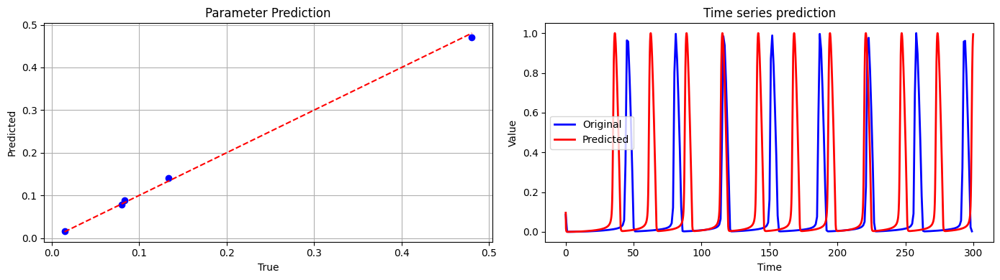

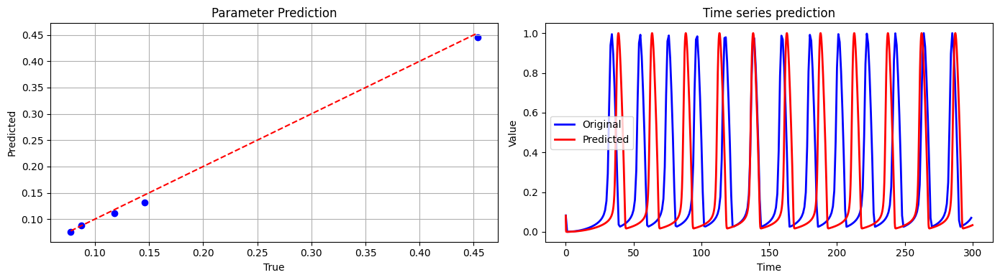

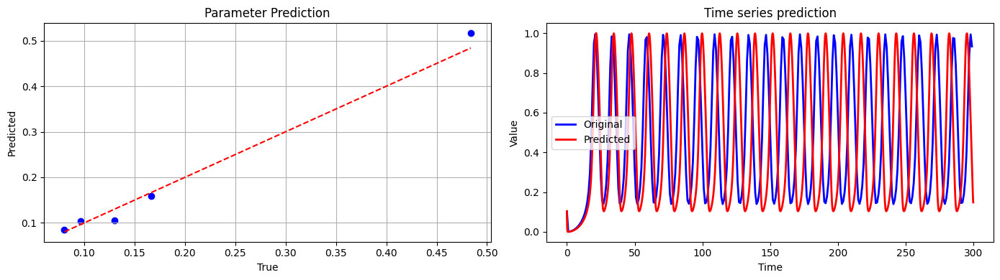

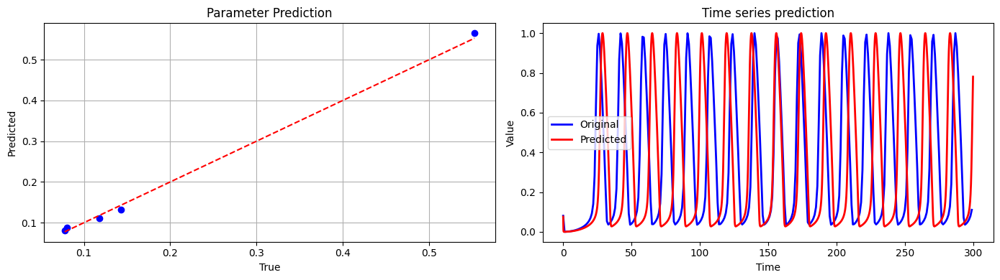

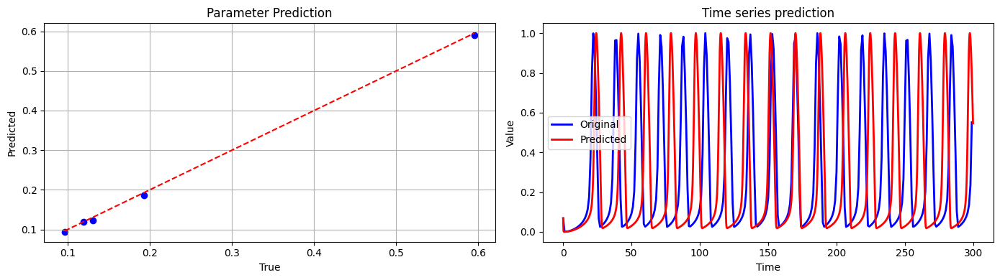

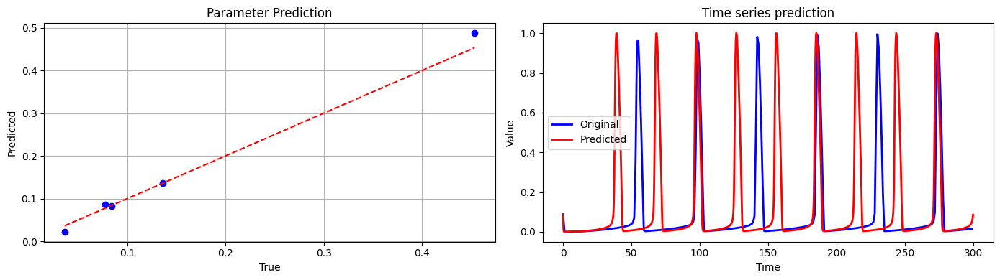

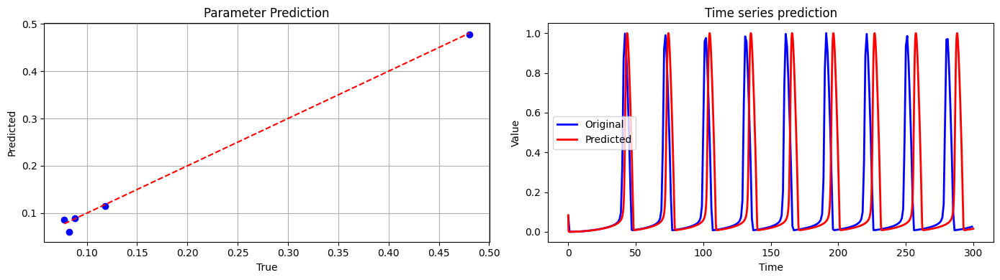

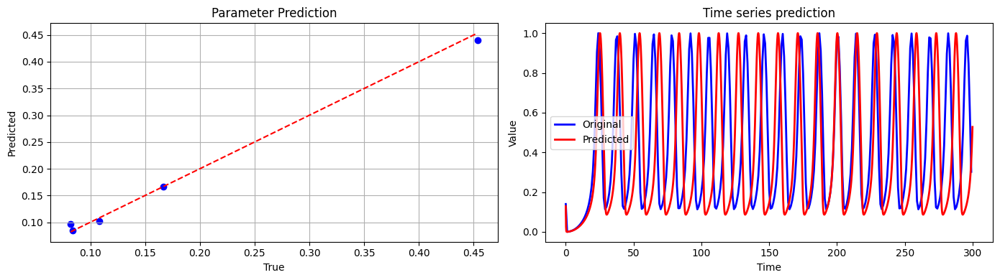

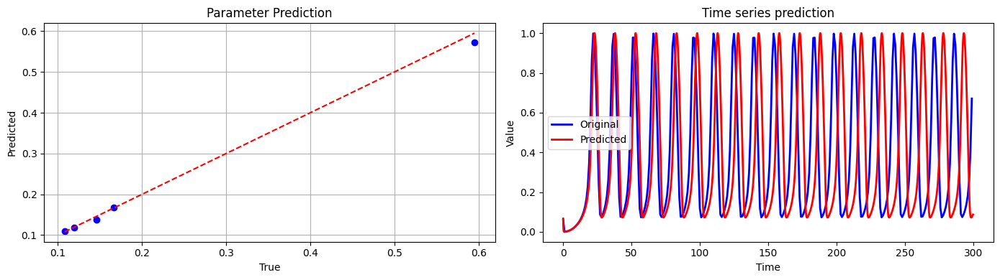

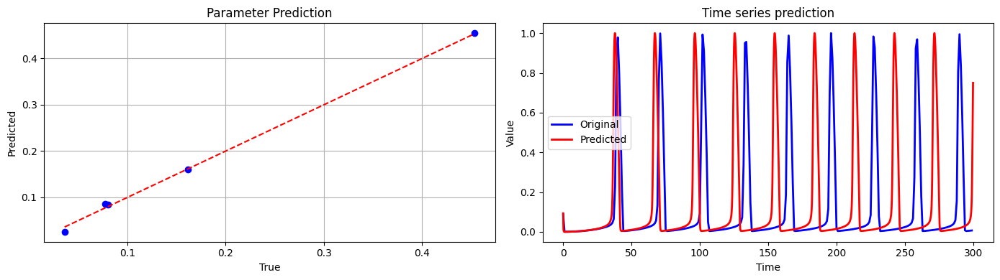

In [24]:
plot_graphs(10, X_cv, y_cv, yhat_cv)

In [25]:
yhat_test = model.predict(X_test)
yhat_test = pd.DataFrame(yhat_test)
yhat_test

33/33 [==============================] - 0s 2ms/step


,0,1,2,3,4
0,0.103891,0.119178,0.465589,0.087682,0.081831
1,0.081206,0.187103,0.393531,0.089597,0.066437
2,0.104466,0.173895,0.457650,0.086545,0.074854
3,0.113235,0.182200,0.455632,0.086163,0.099794
4,0.070596,0.168320,0.488551,0.084983,0.079300
...,...,...,...,...,...
1046,0.134766,0.111681,0.463522,0.088191,0.085852
1047,0.137229,0.160146,0.460202,0.084610,0.108676
1048,0.116376,0.183222,0.508482,0.087114,0.089630
1049,0.055434,0.148156,0.555529,0.087594,0.083227


In [26]:
y_test

,v2,a2,IP3,d5,k3
1729,0.098440,0.118291,0.480371,0.087894,0.083610
626,0.098440,0.192568,0.412450,0.087444,0.070881
333,0.098440,0.171915,0.483842,0.087444,0.077682
12501,0.130296,0.192568,0.453419,0.094050,0.100028
15760,0.082118,0.166686,0.483842,0.080423,0.070881
...,...,...,...,...,...
4221,0.143235,0.118291,0.453347,0.083579,0.083610
5948,0.145631,0.166686,0.453347,0.087894,0.108099
69,0.098440,0.171915,0.552382,0.087894,0.100028
11890,0.036112,0.136246,0.595215,0.080423,0.077682


In [27]:
rmse(np.array(y_test), np.array(yhat_test))

0.02710043643253509

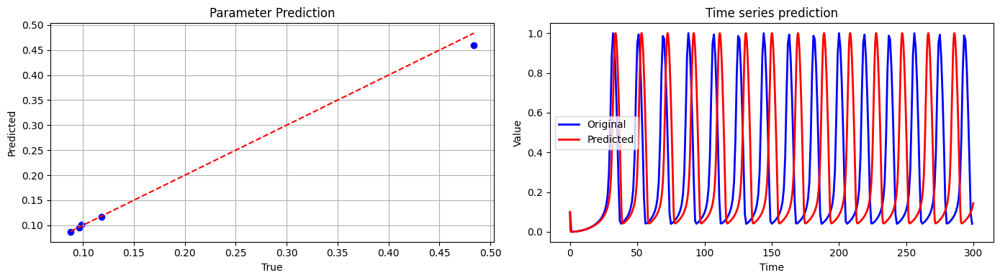

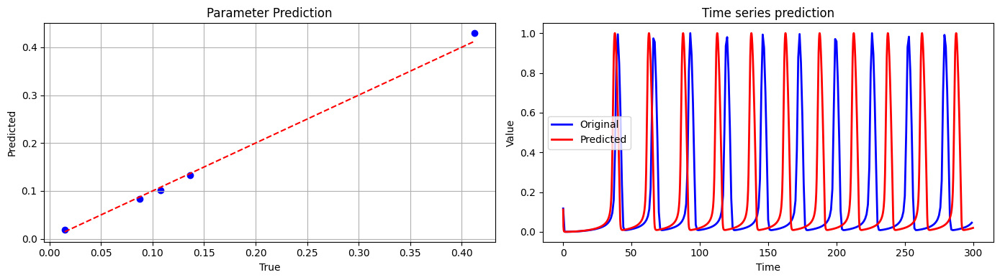

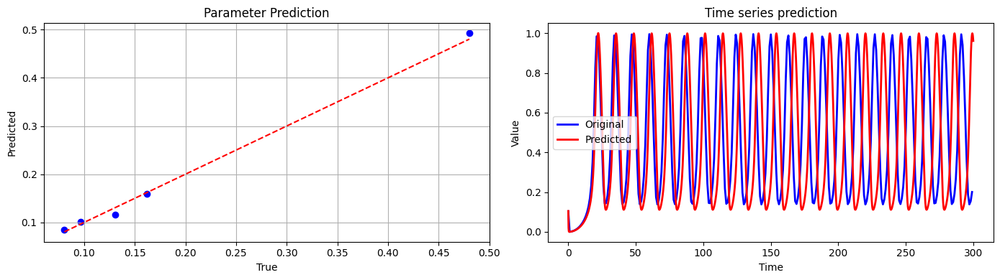

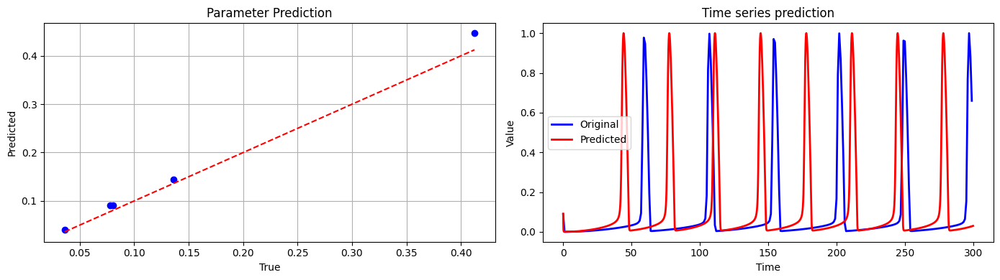

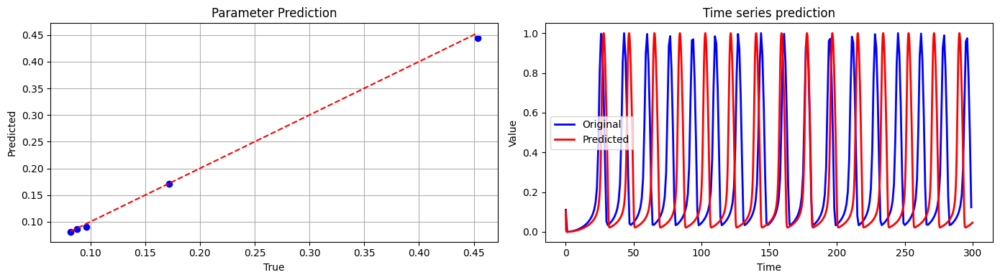

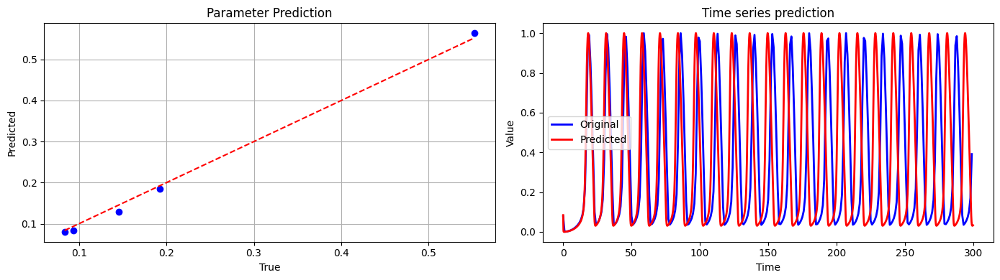

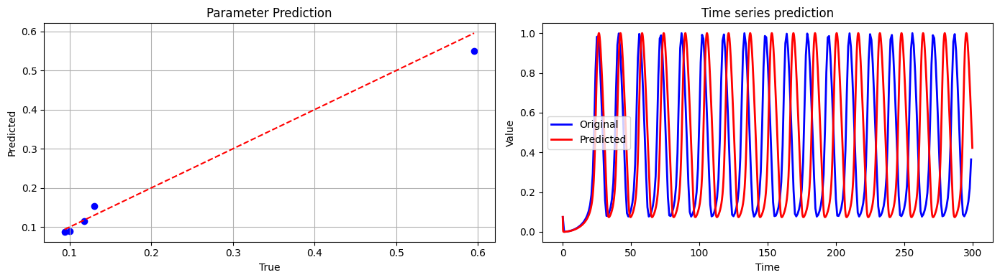

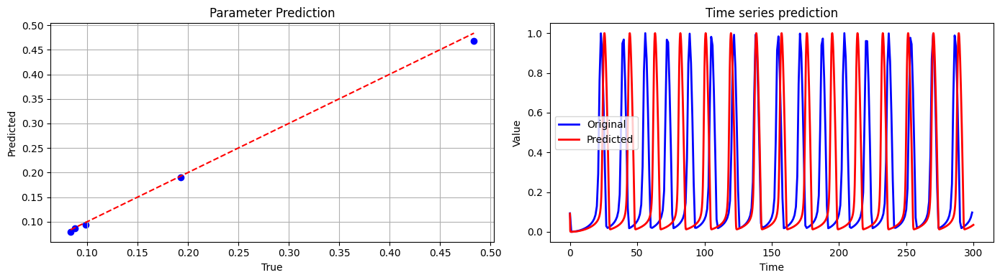

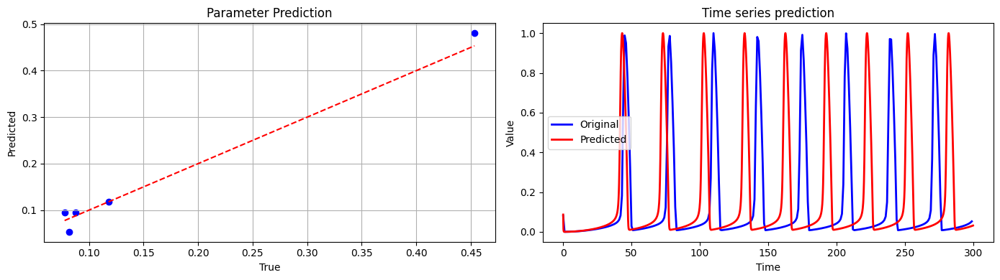

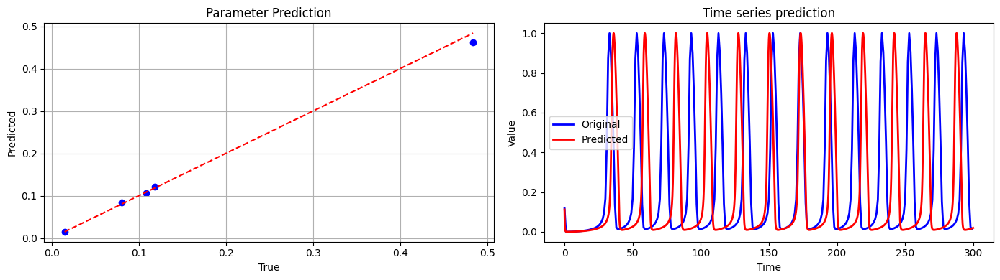

In [28]:
plot_graphs(10, X_test, y_test, yhat_test)

In [29]:
df = pd.read_excel("D:\Studies\Semester 3\Applied Mathematics\Python Tutorials\Data\Group6_Data.xlsx")
time, mean = df.to_numpy().T
degree = 2
poly_coeffs = np.polyfit(time, mean, degree)
baseline = np.polyval(poly_coeffs, time)
baseline_corrected_values = mean - baseline
min_value = np.min(baseline_corrected_values)

max_value = np.max(baseline_corrected_values)
normalized_data = (baseline_corrected_values - min_value) / (max_value - min_value)
exp_data = normalized_data[:300]
exp_data.shape

(300,)

In [30]:
yhat_exp = model.predict(exp_data.reshape(1, 300))
print(yhat_exp)

1/1 [==============================] - 0s 54ms/step
[[0.06394202 0.17250915 0.397848   0.09439022 0.10444992]]


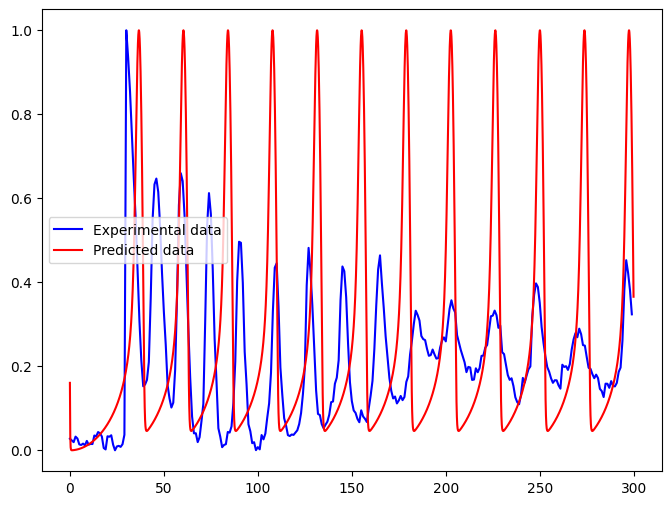

In [31]:
pred_data = lirinzel_ns(yhat_exp[0][0], yhat_exp[0][1], yhat_exp[0][2], yhat_exp[0][3], yhat_exp[0][4])
t = np.arange(0, 300, 1)
time = np.arange(0, 300, 0.1)
plt.figure(figsize=(8,6))
plt.plot(t, exp_data, c='blue', label="Experimental data")
plt.plot(time, pred_data, c='red', label="Predicted data")
plt.legend()
plt.show()

## **New Data**

In [32]:
df = pd.read_excel("simulated_data1.xlsx")
df.shape

(7776, 305)

In [33]:
filt_df = filter_data(df)
filt_df.shape

(4052, 305)

In [34]:
X1 = filt_df.iloc[:, :300]
y1 = filt_df.iloc[:, 300:]
print(X1.shape)
print(y1.shape)

(4052, 300)
(4052, 5)


In [35]:
yhat1 = model.predict(X1)
yhat1 = pd.DataFrame(yhat1)
yhat1

127/127 [==============================] - 0s 752us/step


,0,1,2,3,4
0,0.107705,0.196758,0.456838,0.088609,0.092493
1,0.123353,0.187470,0.463236,0.087333,0.092221
2,0.124654,0.193394,0.479969,0.098432,0.085128
3,0.118658,0.198029,0.470845,0.089073,0.095218
4,0.113989,0.200908,0.455959,0.090378,0.097581
...,...,...,...,...,...
4047,0.061281,0.124200,0.391587,0.086799,0.094871
4048,0.053572,0.130549,0.417930,0.086039,0.094487
4049,0.031442,0.128453,0.441092,0.090859,0.107520
4050,0.051064,0.130153,0.438633,0.096535,0.097033


In [36]:
y1

,v2,a2,IP3,d5,k3
0,0.125542,0.197634,0.468730,0.096606,0.096671
1,0.125542,0.197634,0.468730,0.096606,0.099634
5,0.125542,0.197634,0.468730,0.096606,0.083185
6,0.125542,0.197634,0.468730,0.092056,0.096671
7,0.125542,0.197634,0.468730,0.092056,0.099634
...,...,...,...,...,...
7747,0.044842,0.129886,0.422431,0.092056,0.099634
7752,0.044842,0.129886,0.422431,0.085464,0.096671
7753,0.044842,0.129886,0.422431,0.085464,0.099634
7754,0.044842,0.129886,0.422431,0.085464,0.086228


In [37]:
rmse(np.array(y1), np.array(yhat1))

0.035513054031541244

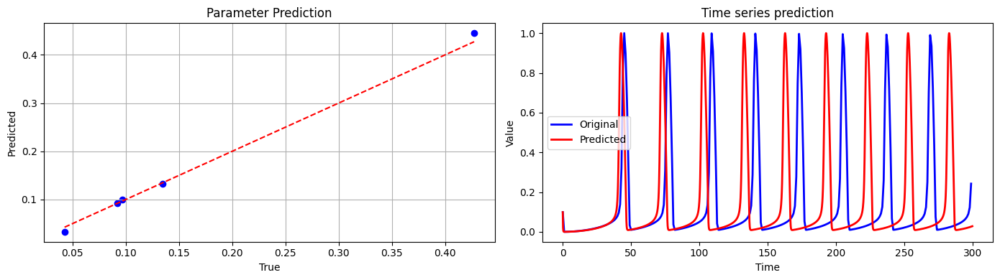

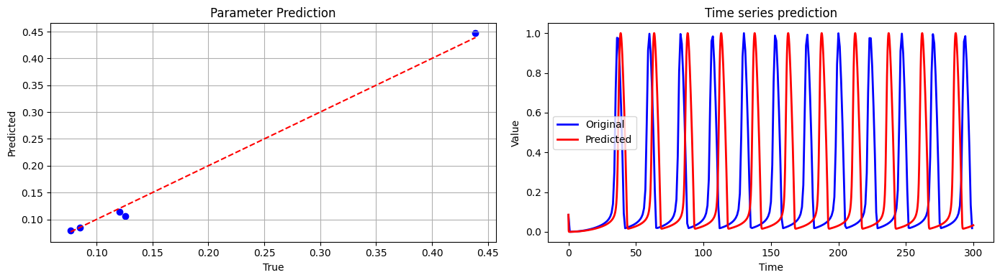

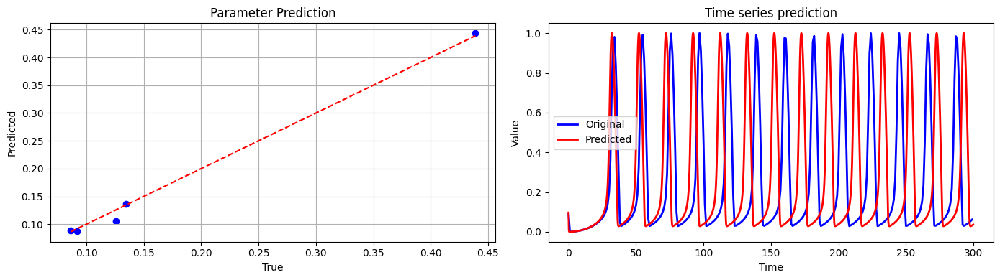

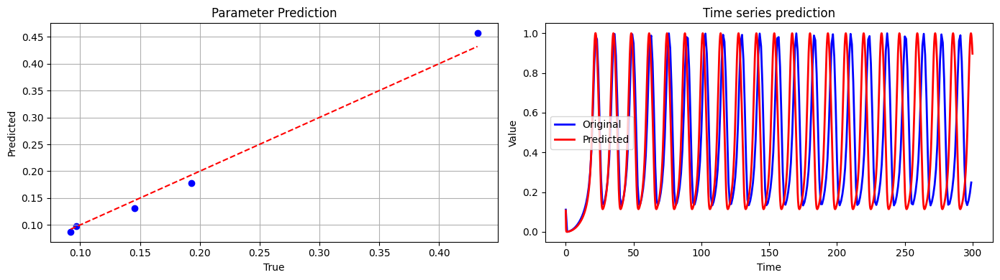

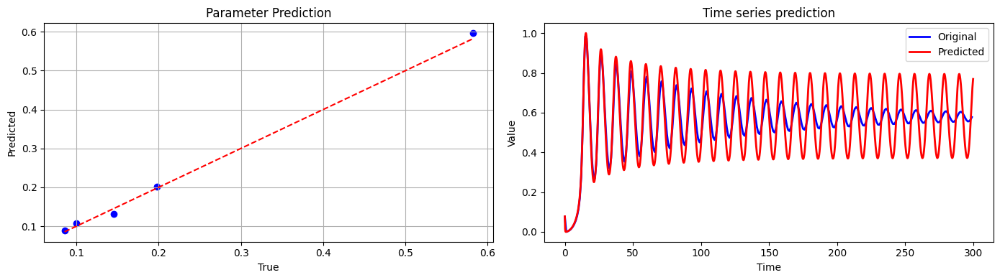

...

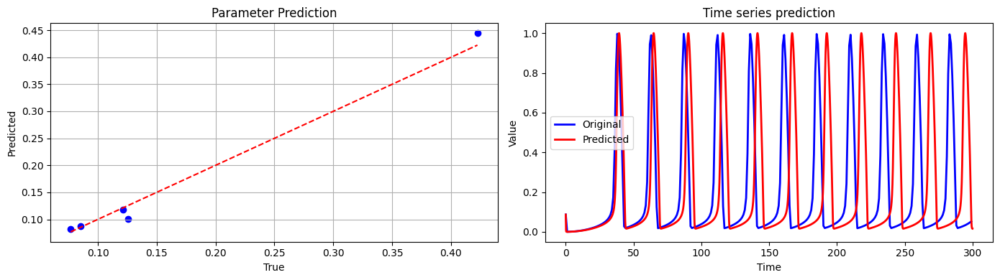

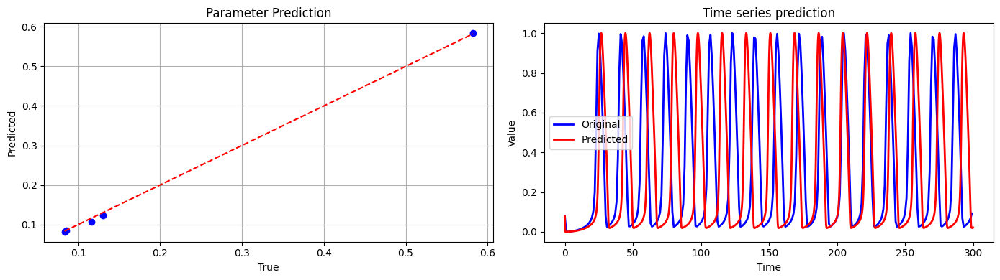

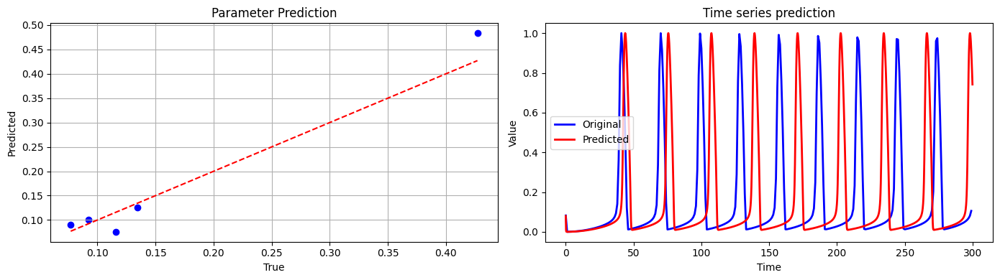

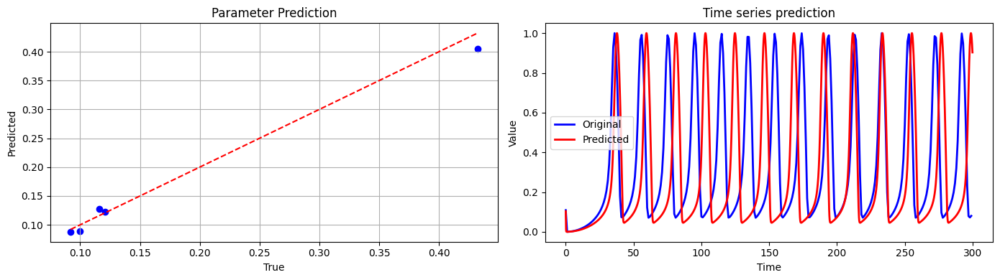

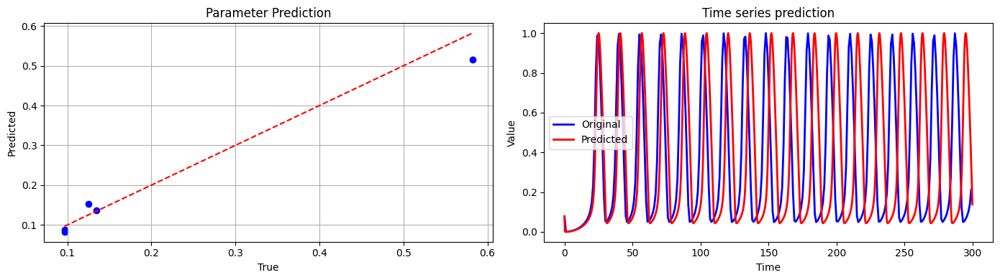

In [38]:
plot_graphs(100, X1, y1, yhat1)